In [ ]:
import torch
from torch.utils.data import DataLoader
from torchvision import transforms
from torchvision.datasets import ImageFolder
import matplotlib.pyplot as plt
import numpy as np

%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [ ]:
from gan.train import train

In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "gpu")

# GAN loss functions


You'll need to implement two different loss functions. The first is the loss from the [original GAN paper](https://arxiv.org/pdf/1406.2661.pdf). The next is the loss from [LS-GAN](https://arxiv.org/abs/1611.04076).


### GAN loss

**TODO:** You need to implement the `discriminator_loss` and `generator_loss` functions in `gan/losses.py`.

The generator loss is given by:
$$\ell_G  =  -\mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
and the discriminator loss is:
$$ \ell*D = -\mathbb{E}*{x \sim p*\text{data}}\left[\log D(x)\right] - \mathbb{E}*{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$

Note that these equations are negated because we will be _minimizing_ these losses.

**HINTS**: Use the `torch.nn.functional.binary_cross_entropy_with_logits` function to compute the binary cross entropy loss since it is more numerically stable than using a softmax followed by BCE loss.

We will be averaging over the elements of the minibatch instead of computing the expectation of $\log D(G(z))$, $\log D(x)$ and $\log \left(1-D(G(z))\right)$.


In [ ]:
from gan.losses import discriminator_loss, generator_loss

### Least Squares GAN loss

**TODO:** You need to implement the `ls_discriminator_loss` and `ls_generator_loss` functions in `gan/losses.py`.

[Least Squares GAN](https://arxiv.org/abs/1611.04076) is an alernative to the original GAN loss function.
For this part, all you need to do change the loss function and retrain the model.

Specifically, you'll implement equation (9) in the paper:
$$\ell_G  =  \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[\left(D(G(z))-1\right)^2\right]$$
and the discriminator loss:
$$ \ell*D = \frac{1}{2}\mathbb{E}*{x \sim p*\text{data}}\left[\left(D(x)-1\right)^2\right] + \frac{1}{2}\mathbb{E}*{z \sim p(z)}\left[ \left(D(G(z))\right)^2\right]$$


In [ ]:
from gan.losses import ls_discriminator_loss, ls_generator_loss

# GAN model architecture

**TODO:** Next, you'll need to implement the `Discriminator` and `Generator` networks in `gan/models.py`.

We'll be using the architecture from [DCGAN](https://arxiv.org/pdf/1511.06434.pdf):

**Discriminator:**

- convolutional layer with in_channels=3, out_channels=128, kernel=4, stride=2
- convolutional layer with in_channels=128, out_channels=256, kernel=4, stride=2
- batch norm
- convolutional layer with in_channels=256, out_channels=512, kernel=4, stride=2
- batch norm
- convolutional layer with in_channels=512, out_channels=1024, kernel=4, stride=2
- batch norm
- convolutional layer with in_channels=1024, out_channels=1, kernel=4, stride=1

Use padding = 1 (not 0) for all the convolutional layers.

You can either use LeakyReLu throughout the discriminator (and a negative slope value of 0.2) or just use relu.

The discriminator will output a single score for each sample.The output of your discriminator should be a single value score corresponding to each input sample.

**Generator:**

**Note:** Here, you'll need to use transposed convolution (sometimes known as fractionally-strided convolution). This function is implemented in pytorch as `torch.nn.ConvTranspose2d`.

- transpose convolution with in_channels=NOISE_DIM, out_channels=1024, kernel=4, stride=1
- batch norm
- transpose convolution with in_channels=1024, out_channels=512, kernel=4, stride=2
- batch norm
- transpose convolution with in_channels=512, out_channels=256, kernel=4, stride=2
- batch norm
- transpose convolution with in_channels=256, out_channels=128, kernel=4, stride=2
- batch norm
- transpose convolution with in_channels=128, out_channels=3, kernel=4, stride=2

The generator network will need to map the output values between -1 and 1 using a `tanh` nonlinearity. The output should be of size 64x64 with 3 channels for each sample (equal dimensions to the images from the dataset).


In [ ]:
from gan.models import Discriminator, Generator

# Data loading

Our dataset is pretty small, so in order to prevent overfitting, we need to perform data augmentation.


In [ ]:
# Define batch size and image size
batch_size = 32
imsize = 64
cat_root = './cats'

# Define data augmentation transforms
data_transforms = transforms.Compose([
    transforms.RandomCrop(imsize),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
    transforms.ToTensor(),
])

# Load the dataset with data augmentation
cat_train = ImageFolder(root=cat_root, transform=data_transforms)

# Create DataLoader
cat_loader_train = DataLoader(cat_train, batch_size=batch_size, drop_last=True)

### Visualize dataset


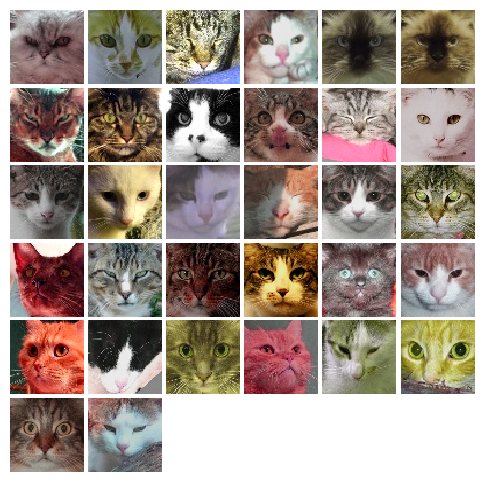

In [ ]:
from gan.utils import show_images

# Get a batch of images from the data loader
imgs, _ = next(iter(cat_loader_train))
imgs = imgs.numpy()  # Convert tensor to numpy array
imgs = imgs.squeeze()  # Remove the batch dimension if it exists

# Display the images
show_images(imgs, color=True)


# Training


In [ ]:
NOISE_DIM = 100
NUM_EPOCHS = 50
learning_rate = 0.001

### Train GAN


In [ ]:
D = Discriminator().to(device)
G = Generator(noise_dim=NOISE_DIM).to(device)

In [ ]:
D_optimizer = torch.optim.Adam(D.parameters(), lr=learning_rate, betas = (0.5, 0.999))
G_optimizer = torch.optim.Adam(G.parameters(), lr=learning_rate, betas = (0.5, 0.999))

Iter: 0, D: 1.388, G:5.579


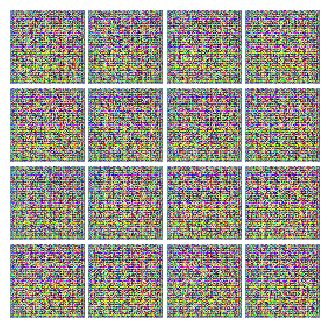


Iter: 1000, D: 1.499, G:4.326


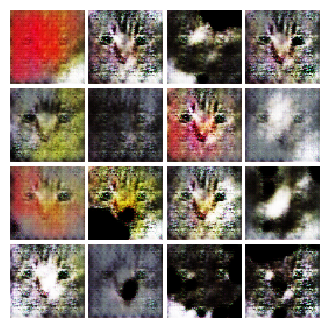


Iter: 2000, D: 0.2841, G:3.57


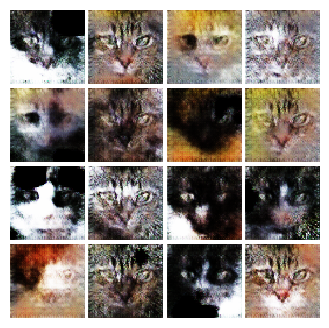


Iter: 3000, D: 0.2698, G:3.288


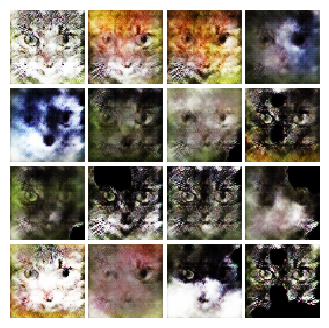


Iter: 4000, D: 0.1954, G:4.497


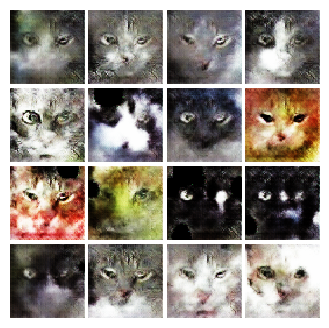


Iter: 5000, D: 1.803, G:17.56


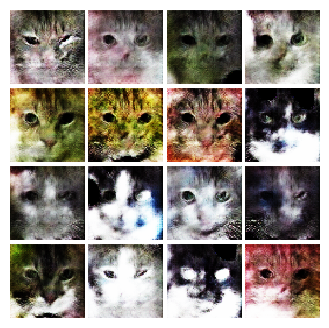


Iter: 6000, D: 0.202, G:9.688


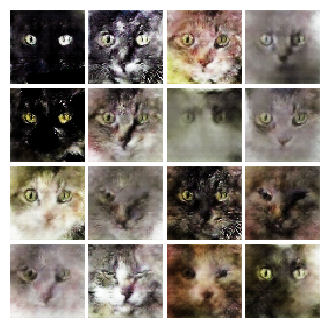


Iter: 7000, D: 0.05854, G:6.482


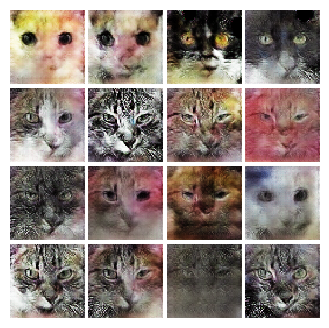


Iter: 8000, D: 0.4302, G:8.872


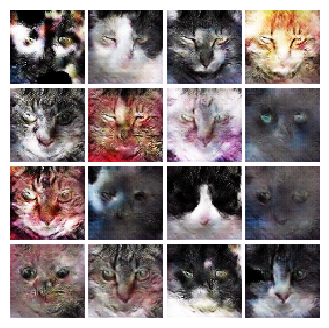


Iter: 9000, D: 0.07709, G:8.062


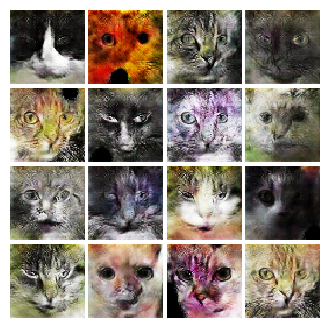


Iter: 10000, D: 0.09079, G:5.232


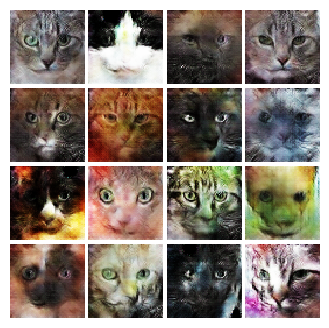


Iter: 11000, D: 0.04844, G:9.357


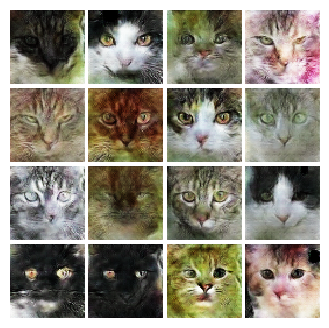


Iter: 12000, D: 0.04358, G:7.382


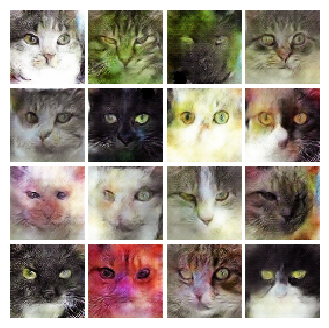


Iter: 13000, D: 0.2554, G:8.077


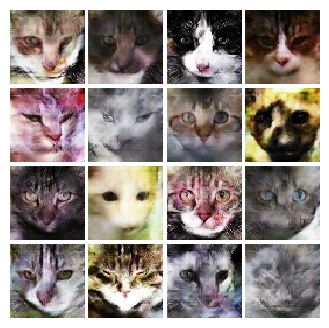


Iter: 14000, D: 0.08163, G:8.088


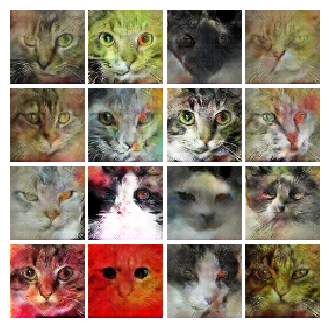


Iter: 15000, D: 0.5269, G:3.609


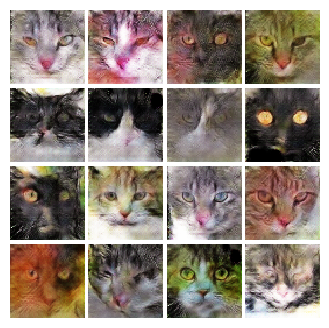


Iter: 16000, D: 0.6909, G:7.16


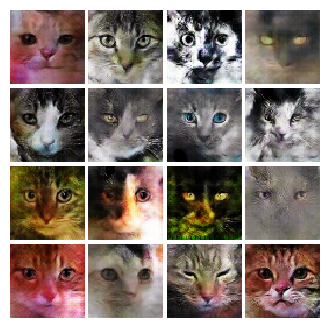


Iter: 17000, D: 0.3702, G:7.983


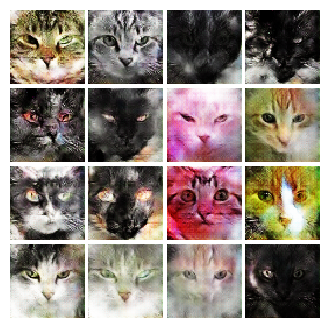


Iter: 18000, D: 0.059, G:11.99


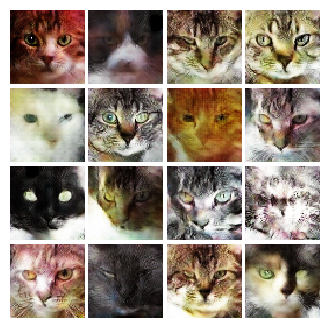


Iter: 19000, D: 0.05834, G:5.256


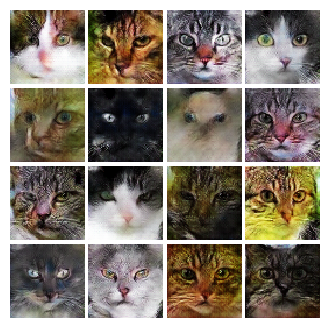


Iter: 20000, D: 0.1248, G:6.149


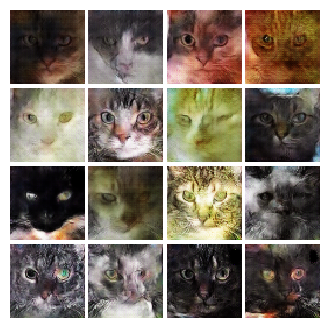


Iter: 21000, D: 0.1512, G:8.857


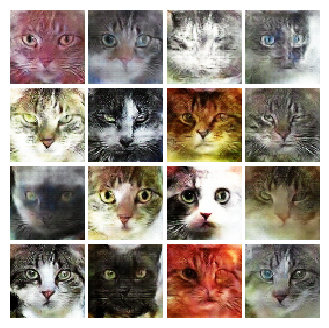


Iter: 22000, D: 0.02882, G:8.332


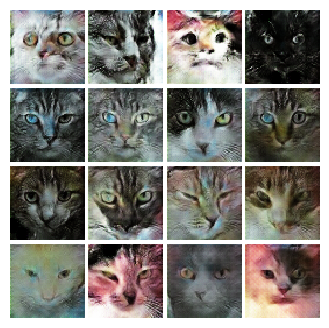


Iter: 23000, D: 0.073, G:9.521


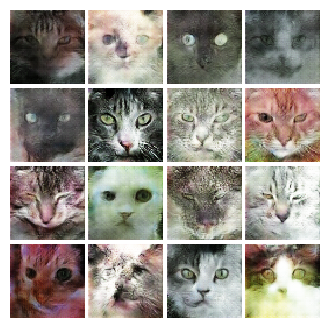


Iter: 24000, D: 0.04259, G:5.928


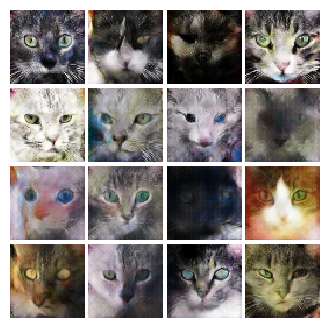

In [ ]:
# original gan
train(D, G, D_optimizer, G_optimizer, discriminator_loss,
          generator_loss, num_epochs=NUM_EPOCHS, show_every=1000,
          batch_size=batch_size, train_loader=cat_loader_train, device=device)


### Train LS-GAN


In [ ]:
D = Discriminator().to(device)
G = Generator(noise_dim=NOISE_DIM).to(device)

In [ ]:
D_optimizer = torch.optim.Adam(D.parameters(), lr=learning_rate, betas = (0.5, 0.999))
G_optimizer = torch.optim.Adam(G.parameters(), lr=learning_rate, betas = (0.5, 0.999))

Iter: 0, D: 0.2402, G:0.1565


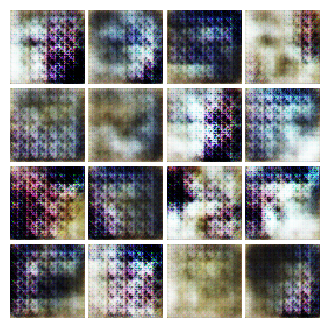


Iter: 1000, D: 0.4037, G:0.3233


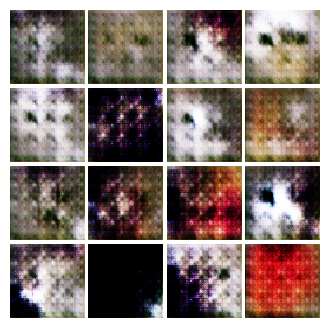


Iter: 2000, D: 0.2267, G:0.2026


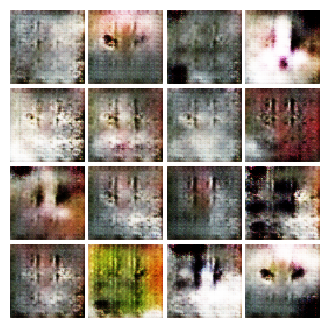


Iter: 3000, D: 0.2224, G:0.2522


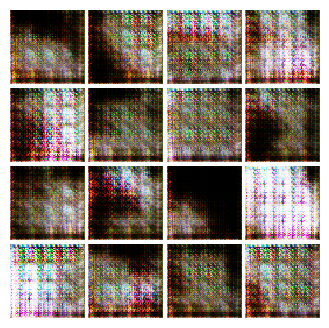


Iter: 4000, D: 0.3291, G:0.2175


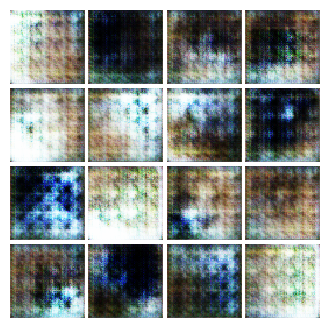


Iter: 5000, D: 0.277, G:0.1818


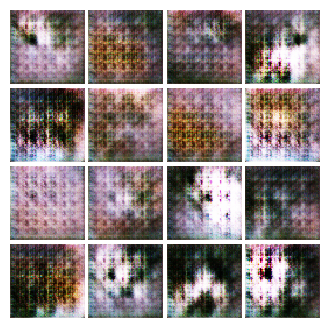


Iter: 6000, D: 0.2559, G:0.1349


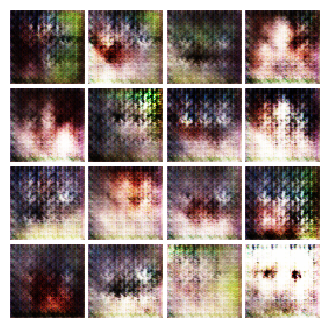


Iter: 7000, D: 0.2323, G:0.1821


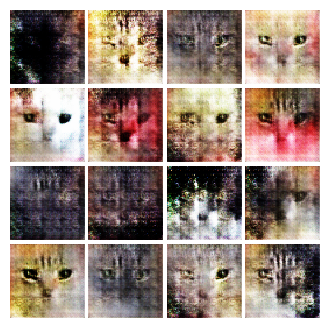


Iter: 8000, D: 0.3076, G:0.3284


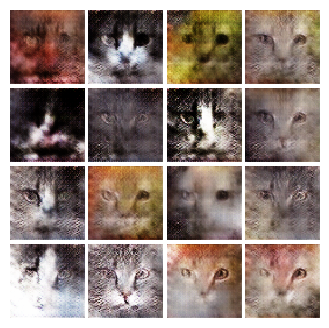


Iter: 9000, D: 0.2286, G:0.2552


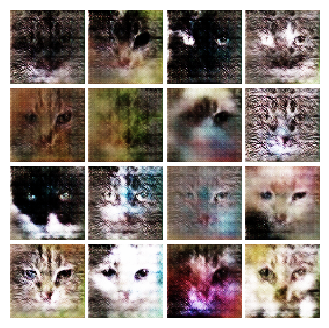


Iter: 10000, D: 0.1892, G:0.3845


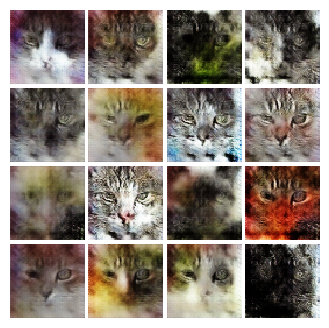


Iter: 11000, D: 0.1718, G:0.3609


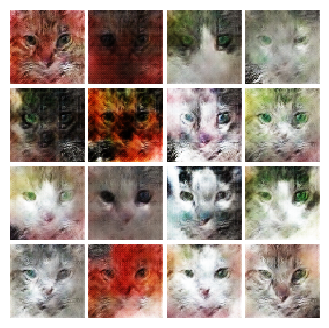


Iter: 12000, D: 0.1752, G:0.5126


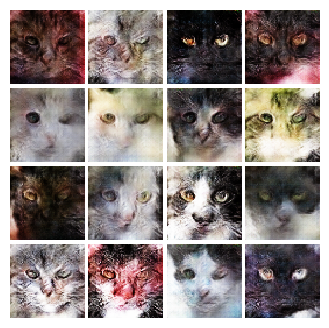


Iter: 13000, D: 0.07534, G:0.6453


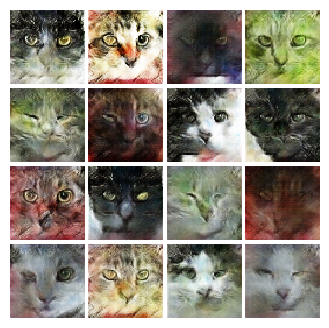


Iter: 14000, D: 0.09614, G:0.9333


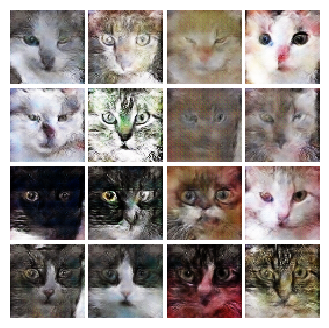


Iter: 15000, D: 0.07375, G:0.3341


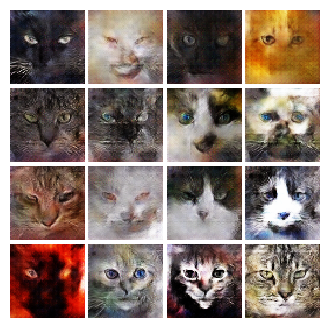


Iter: 16000, D: 0.2634, G:0.123


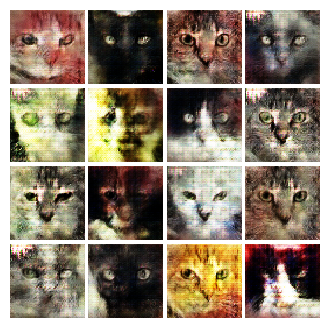


Iter: 17000, D: 0.2402, G:0.1418


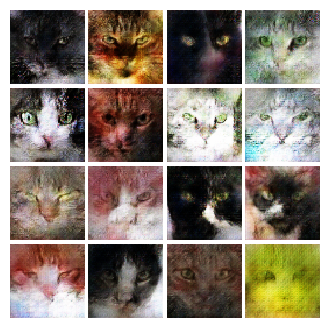


Iter: 18000, D: 0.2516, G:0.1513


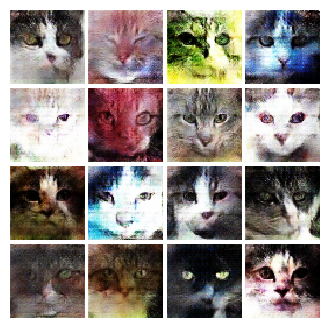


Iter: 19000, D: 0.2479, G:0.2345


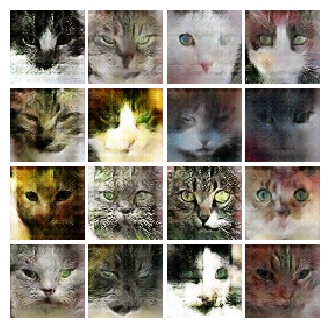


Iter: 20000, D: 0.1189, G:0.3254


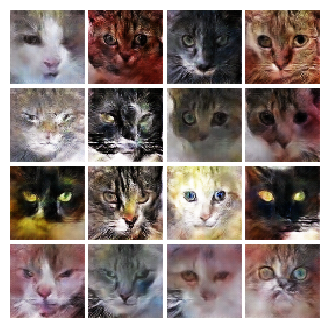


Iter: 21000, D: 0.08066, G:0.3932


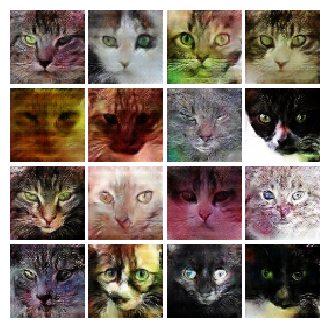


Iter: 22000, D: 0.09638, G:0.356


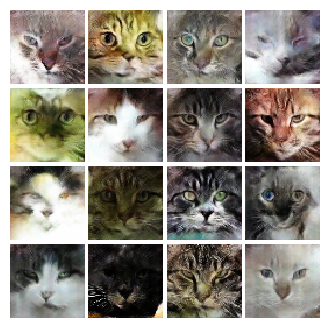


Iter: 23000, D: 0.03285, G:0.5491


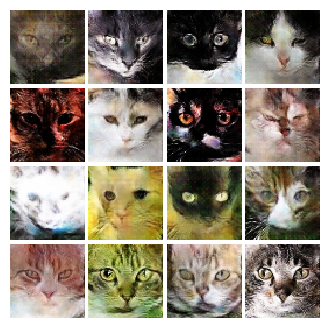


Iter: 24000, D: 0.03152, G:0.5197


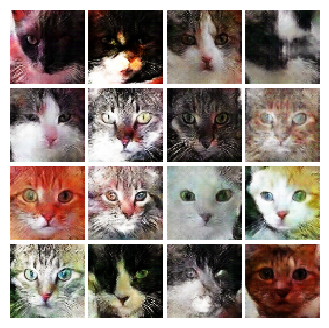

In [ ]:
# ls-gan
train(D, G, D_optimizer, G_optimizer, ls_discriminator_loss,
          ls_generator_loss, num_epochs=NUM_EPOCHS, show_every=1000,
          batch_size=batch_size, train_loader=cat_loader_train, device=device)